In [14]:
import json
import pandas as pd

pd.set_option('display.max_colwidth', None)
with open("data/processed/data.jsonl", "r", encoding="utf-8") as f:
    data = [json.loads(line) for line in f]

df = pd.DataFrame(data)
df.head()

,text,target
0,часть силы [MASK] [TGT] хочет [/TGT] зла вечно совершает,вечно
1,второй плечистый рыжеватый вихрастый [MASK] [TGT] человек [/TGT] заломленной затылок клетчатой кепке ковбойке жеваных белых брюках черных тапочках,молодой
2,первый иной михаил александрович берлиоз председатель правления крупнейших московских [MASK] [TGT] ассоциаций [/TGT] сокращенно именуемой массолит редактор толстого художественного журнала молодой спутник поэт иван николаевич понырев пишущий псевдонимом бездомный,литературных
3,попав тень зеленеющих лип писатели [MASK] [TGT] долгом [/TGT] бросились пестро раскрашенной будочке надписью пиво воды,первым
4,час сил дышать солнце раскалив москву [MASK] [TGT] тумане [/TGT] валилось садовое кольцо пришел липы сел скамейку пуста аллея,сухом


In [3]:
print(f"Количество строк: {len(df)}")
print("Колонки:", df.columns.tolist())
print("Пример записей:")
print(df.sample(5))

Количество строк: 15260
Колонки: ['text', 'target']
Пример записей:
                                                    text        target
13221  какое [MASK] [TGT] возмездие [/TGT] строивший ...        тайное
3853                     [MASK] [TGT] план [/TGT] удачен      согласны
1196         согласитесь пустить [MASK] [TGT] зал [/TGT]       бальный
12093  война [MASK] [TGT] уничтожив [/TGT] царизм зам...  окончательно
12831  выскакивает трепещущую темноту комнату прямо [...  неприступную


In [4]:
df["length"] = df["text"].apply(lambda x: len(x.split()))
df["length"].describe()

count    15260.000000
mean        12.876540
std          8.027981
min          4.000000
25%          8.000000
50%         11.000000
75%         16.000000
max        181.000000
Name: length, dtype: float64

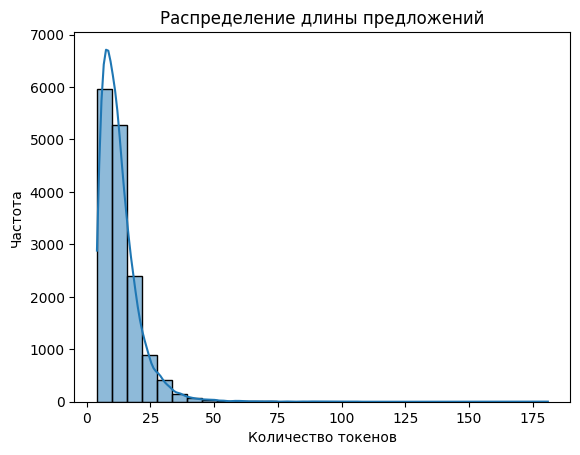

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.histplot(df["length"], bins=30, kde=True)
plt.title("Распределение длины предложений")
plt.xlabel("Количество токенов")
plt.ylabel("Частота")
plt.show()

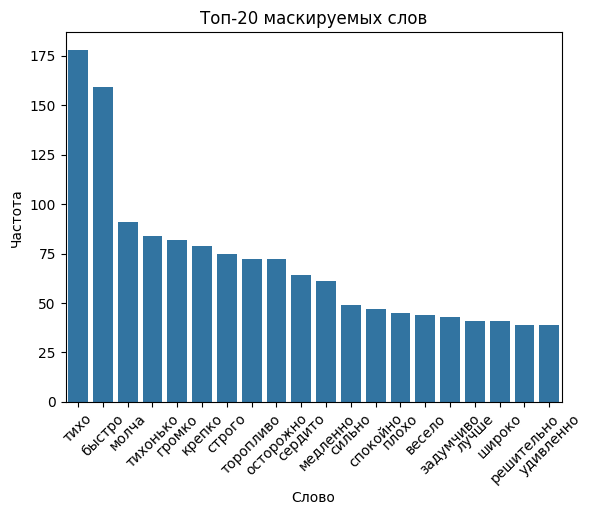

In [6]:
from collections import Counter

target_counts = Counter(df["target"])
most_common = target_counts.most_common(20)

top_df = pd.DataFrame(most_common, columns=["Слово", "Частота"])

sns.barplot(data=top_df, x="Слово", y="Частота")
plt.xticks(rotation=45)
plt.title("Топ-20 маскируемых слов")
plt.show()


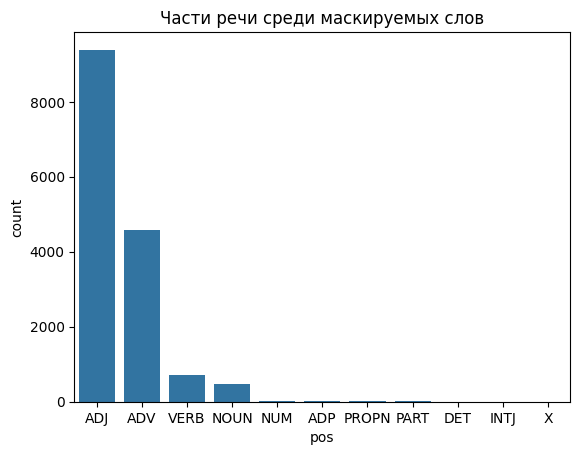

In [7]:
import spacy
nlp = spacy.load("ru_core_news_lg")

def get_pos(word):
    doc = nlp(word)
    return doc[0].pos_ if doc else "X"

df["pos"] = df["target"].apply(get_pos)

sns.countplot(data=df, x="pos", order=df["pos"].value_counts().index)
plt.title("Части речи среди маскируемых слов")
plt.show()

In [8]:
unique_targets = set(df["target"])
print(f"Словарное разнообразие (уникальных маскируемых слов): {len(unique_targets)}")

Словарное разнообразие (уникальных маскируемых слов): 6656


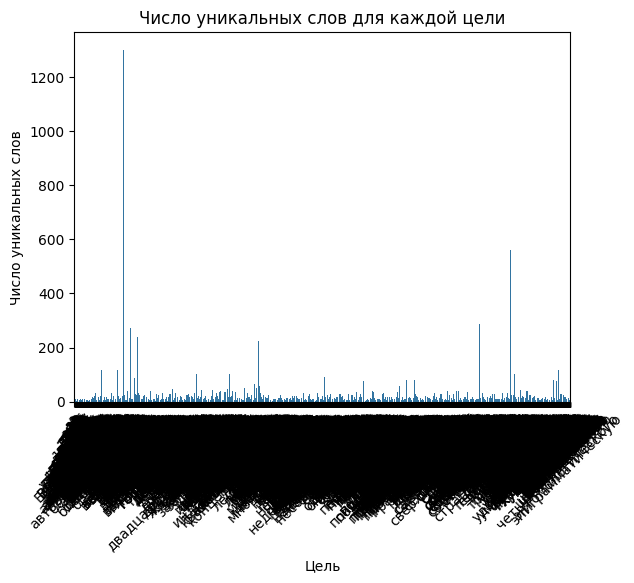

In [9]:
target_unique = df.groupby("target")["text"].apply(lambda x: set(" ".join(x).split()))
target_unique_lengths = target_unique.apply(len)

sns.barplot(x=target_unique_lengths.index, y=target_unique_lengths.values)
plt.title("Число уникальных слов для каждой цели")
plt.xlabel("Цель")
plt.ylabel("Число уникальных слов")
plt.xticks(rotation=45)
plt.show()

In [10]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x="pos", hue="target", order=df["pos"].value_counts().index)
plt.title("Части речи по целевым меткам")
plt.xlabel("Части речи")
plt.ylabel("Частота")
plt.xticks(rotation=45)
plt.show()